In [23]:
library(ggplot2)
library(repr)

# Change plot size to 4 x 3
#options(repr.plot.width=4, repr.plot.height=3)
#curve(sin(x), from = 0, to=2*pi, n = 100)

# Change plot size to 8 x 3
options(repr.plot.width=10, repr.plot.height=5)
#curve(sin(x), from = 0, to=4*pi, n = 200)
#view raw

setwd("~/Research/DBee/")

file <- "results/2_output_old.csv"
df <- read.csv(file, header = TRUE, sep = ",", stringsAsFactors=TRUE)
head(df)
str(df)

multiplot <- function(..., plotlist=NULL, file, cols=1, layout=NULL) {
  library(grid)

  # Make a list from the ... arguments and plotlist
  plots <- c(list(...), plotlist)

  numPlots = length(plots)

  # If layout is NULL, then use 'cols' to determine layout
  if (is.null(layout)) {
    # Make the panel
    # ncol: Number of columns of plots
    # nrow: Number of rows needed, calculated from # of cols
    layout <- matrix(seq(1, cols * ceiling(numPlots/cols)),
                    ncol = cols, nrow = ceiling(numPlots/cols))
  }

 if (numPlots==1) {
    print(plots[[1]])

  } else {
    # Set up the page
    grid.newpage()
    pushViewport(viewport(layout = grid.layout(nrow(layout), ncol(layout))))

    # Make each plot, in the correct location
    for (i in 1:numPlots) {
      # Get the i,j matrix positions of the regions that contain this subplot
      matchidx <- as.data.frame(which(layout == i, arr.ind = TRUE))

      print(plots[[i]], vp = viewport(layout.pos.row = matchidx$row,
                                      layout.pos.col = matchidx$col))
    }
  }
}

,X,day_num,is_day,is_real_result,speed,spread,speed_diff,spread_diff
1,0.000000,0.000000,1.000000,1.000000,11.606600,9.257041,3.733429,1.054753
2,1.000000,0.000000,0.000000,1.000000,7.873171,10.311794,NA,NA
3,2.00000000,0.00000000,1.00000000,0.00000000,9.89593660,9.62425066,0.03188227,0.05050205
4,3.000000,0.000000,0.000000,0.000000,9.927819,9.674753,NA,NA
5,4.00000000,0.00000000,1.00000000,0.00000000,9.92476111,9.62211179,0.04409123,0.05537165
6,5.000000,0.000000,0.000000,0.000000,9.880670,9.677483,NA,NA


'data.frame':	2626 obs. of  8 variables:
 $ X             : int  0 1 2 3 4 5 6 7 8 9 ...
 $ day_num       : int  0 0 0 0 0 0 0 0 0 0 ...
 $ is_day        : int  1 0 1 0 1 0 1 0 1 0 ...
 $ is_real_result: int  1 1 0 0 0 0 0 0 0 0 ...
 $ speed         : num  11.61 7.87 9.9 9.93 9.92 ...
 $ spread        : num  9.26 10.31 9.62 9.67 9.62 ...
 $ speed_diff    : num  3.7334 NA 0.0319 NA 0.0441 ...
 $ spread_diff   : num  1.0548 NA 0.0505 NA 0.0554 ...


In [2]:
df$is_day <- as.factor(df$is_day)
df$is_real_result <- as.factor(df$is_real_result)

str(df)

'data.frame':	2626 obs. of  8 variables:
 $ X             : int  0 1 2 3 4 5 6 7 8 9 ...
 $ day_num       : int  0 0 0 0 0 0 0 0 0 0 ...
 $ is_day        : Factor w/ 2 levels "0","1": 2 1 2 1 2 1 2 1 2 1 ...
 $ is_real_result: Factor w/ 2 levels "0","1": 2 2 1 1 1 1 1 1 1 1 ...
 $ speed         : num  11.61 7.87 9.9 9.93 9.92 ...
 $ spread        : num  9.26 10.31 9.62 9.67 9.62 ...
 $ speed_diff    : num  3.7334 NA 0.0319 NA 0.0441 ...
 $ spread_diff   : num  1.0548 NA 0.0505 NA 0.0554 ...


In [3]:
real_df <- subset(df, is_real_result == 1)
head(real_df)

generated_df <- subset(df, is_real_result == 0)
head(generated_df)

,X,day_num,is_day,is_real_result,speed,spread,speed_diff,spread_diff
1,0,0,1,1,11.60659981,9.257040874,3.733428594,1.054753276
2,1,0,0,1,7.873171219,10.31179415,NA,NA
203,202,1,1,1,11.66424046,10.76577989,0.034582672,0.789167757
204,203,1,0,1,11.62965779,9.976612136,NA,NA
405,404,2,1,1,12.165174,11.26584477,1.279552883,0.197349233
406,405,2,0,1,10.88562112,11.06849554,NA,NA


,X,day_num,is_day,is_real_result,speed,spread,speed_diff,spread_diff
3,2,0,1,0,9.895936597,9.624250663,0.031882272,0.050502054
4,3,0,0,0,9.927818869,9.674752717,NA,NA
5,4,0,1,0,9.924761111,9.622111786,0.044091229,0.055371646
6,5,0,0,0,9.880669882,9.677483432,NA,NA
7,6,0,1,0,9.957216276,9.664338349,0.13013314,0.057349777
8,7,0,0,0,9.827083136,9.606988572,NA,NA


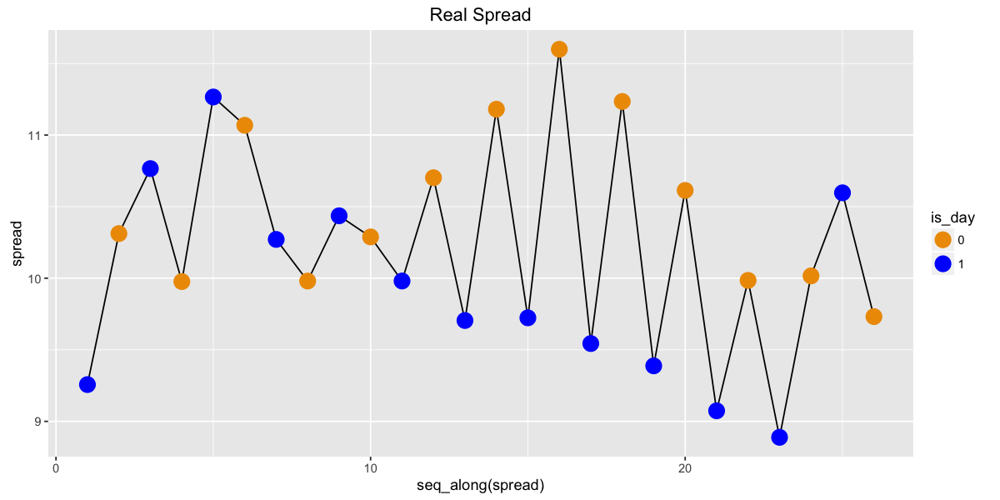

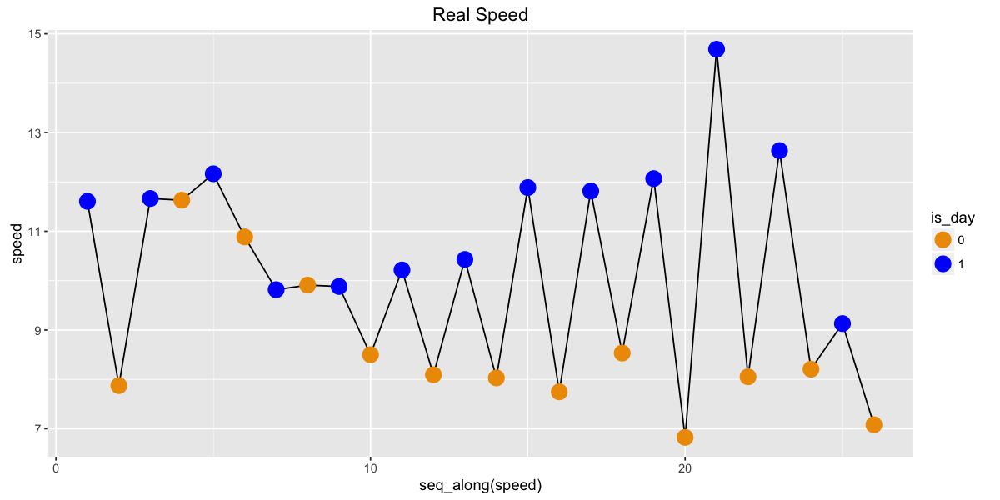

In [4]:
myColors <- c("orange2", "blue")
qplot(data=real_df,y=spread, main='Real Spread') + geom_line() + geom_point(aes(color = is_day,),size=5) + scale_color_manual(values=myColors)
qplot(data=real_df,y=speed, main='Real Speed') + geom_line() + geom_point(aes(color = is_day,),size=5) + scale_color_manual(values=myColors)

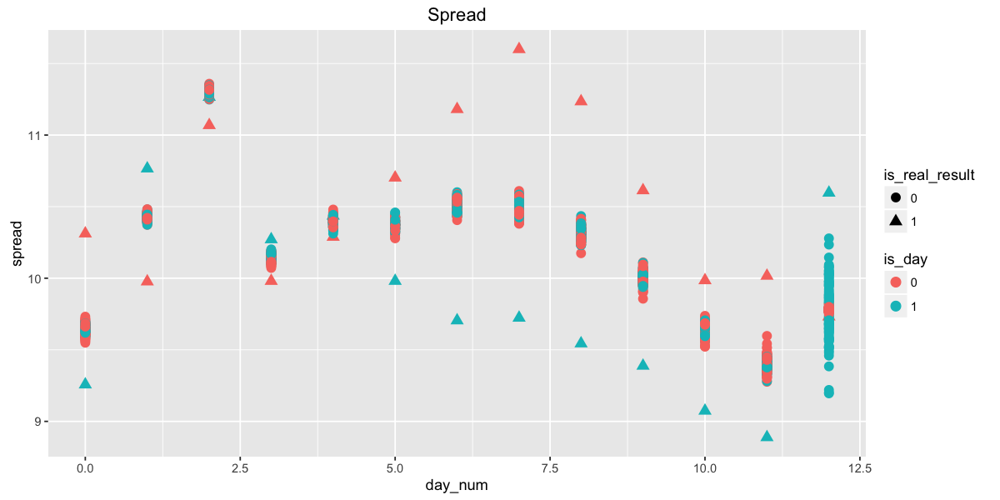

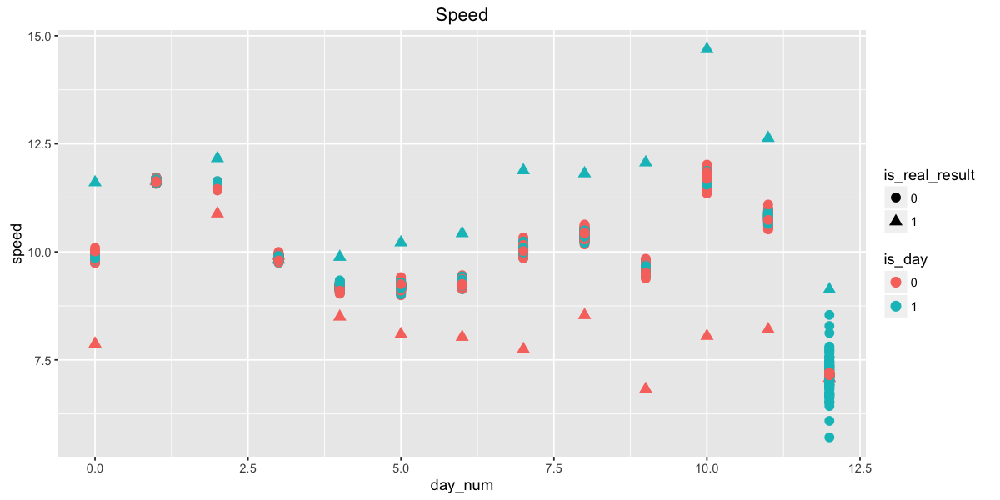

In [5]:
qplot(data=df,x=day_num,y=spread,color=is_day, shape=is_real_result, main='Spread') + geom_point(size=3)
qplot(data=df,x=day_num,y=speed,color=is_day, shape=is_real_result, main='Speed') + geom_point(size=3)

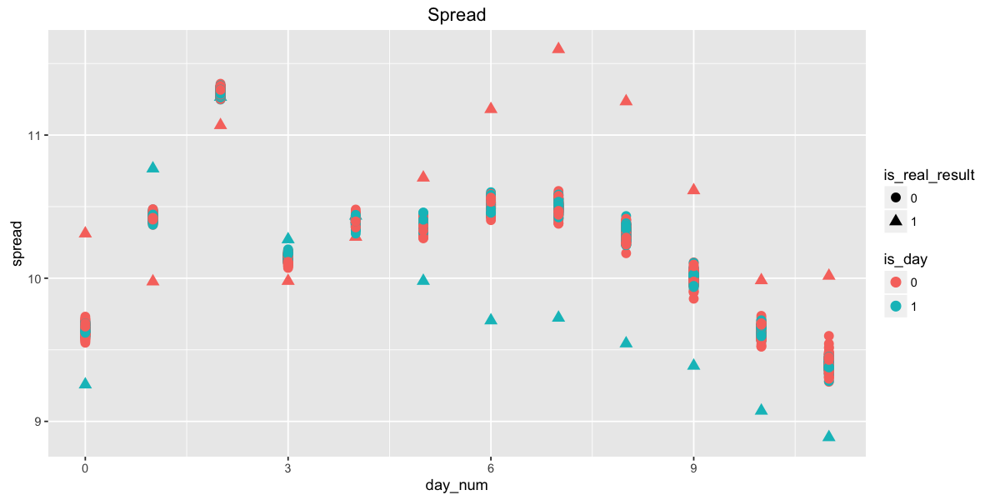

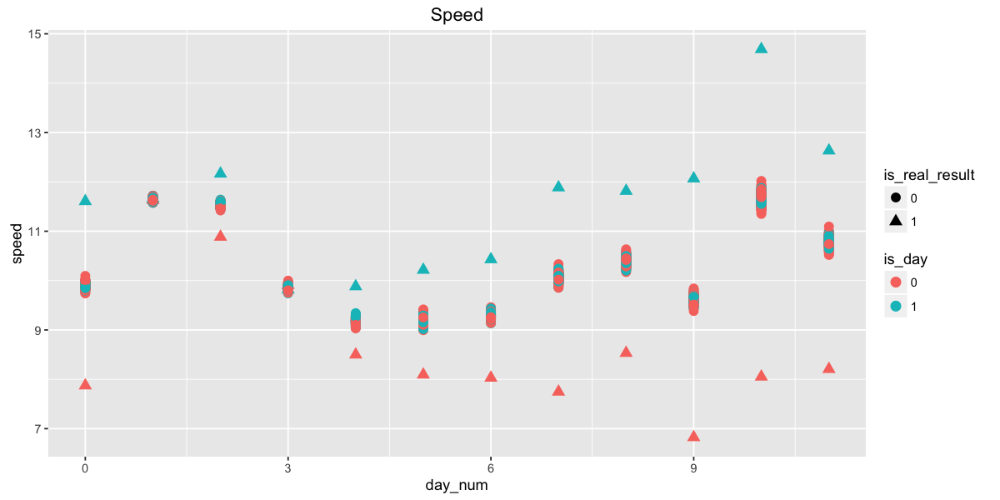

In [6]:
df_filt <- subset(df, df$day_num != max(df$day_num))
qplot(data=df_filt,x=day_num,y=spread,color=is_day, shape=is_real_result, main='Spread') + geom_point(size=3)
qplot(data=df_filt,x=day_num,y=speed,color=is_day, shape=is_real_result, main='Speed') + geom_point(size=3)

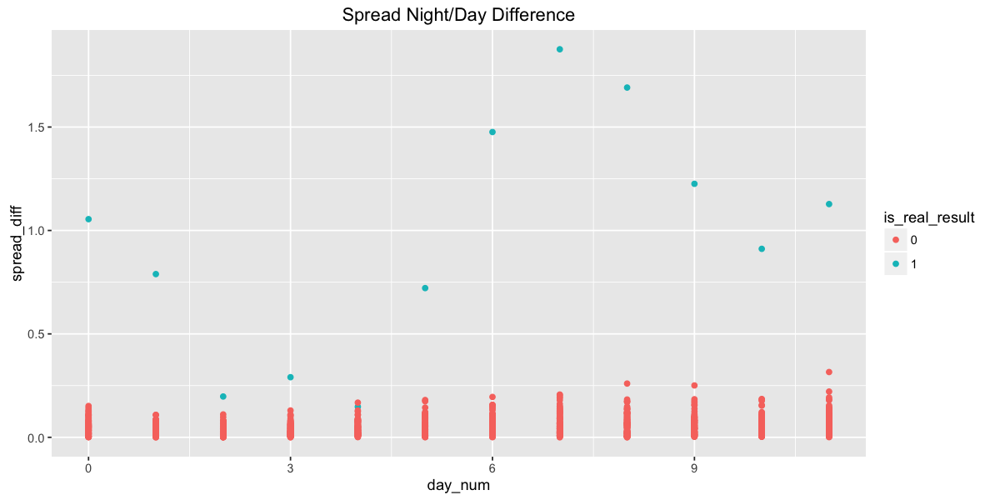

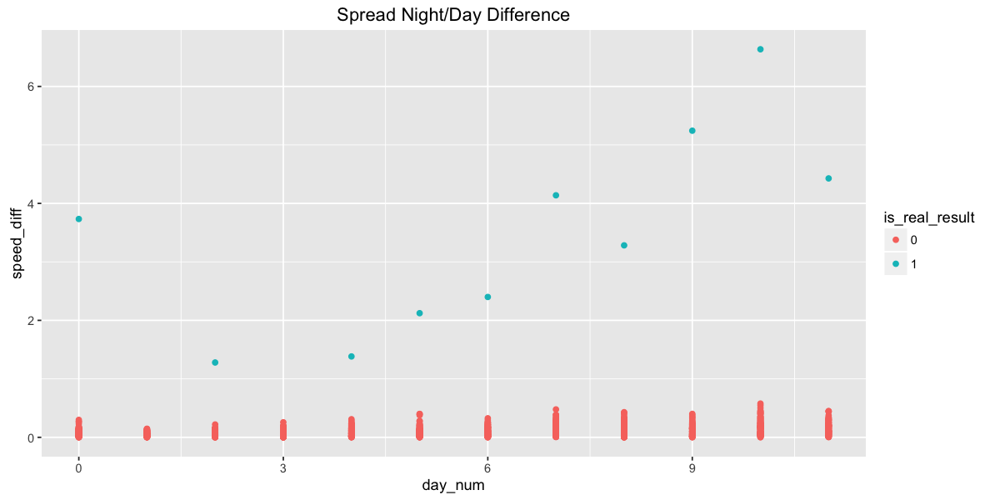

In [7]:
qplot(data=na.omit(df_filt),x=day_num,y=spread_diff,color=is_real_result, main='Spread Night/Day Difference')
qplot(data=na.omit(df_filt),x=day_num,y=speed_diff,color=is_real_result, main='Spread Night/Day Difference')

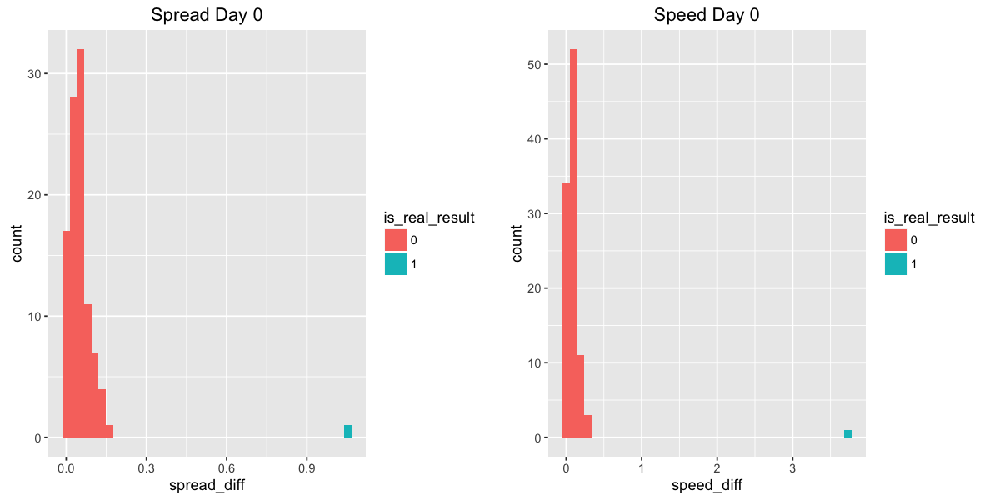

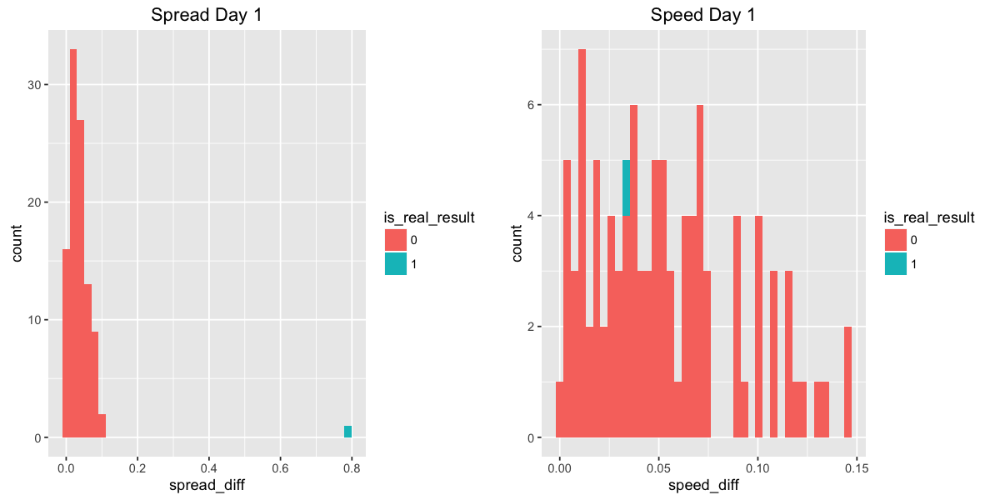

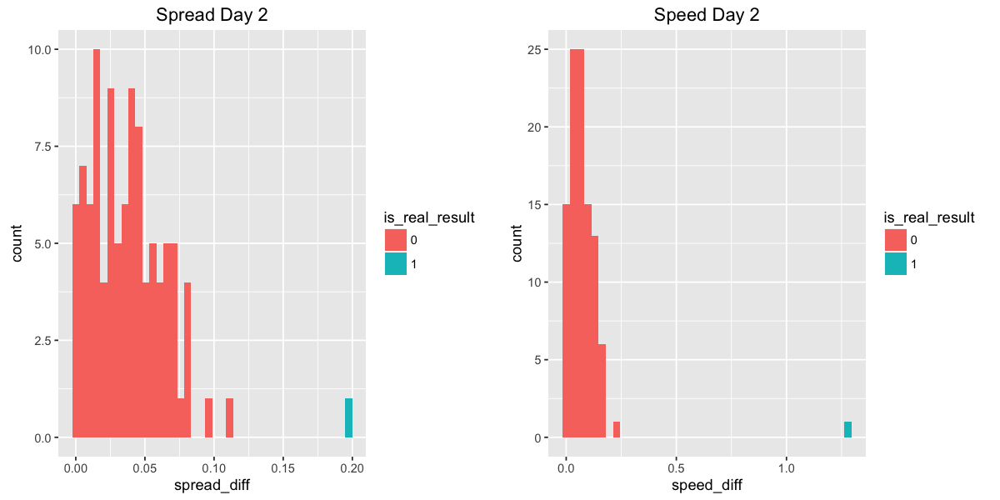

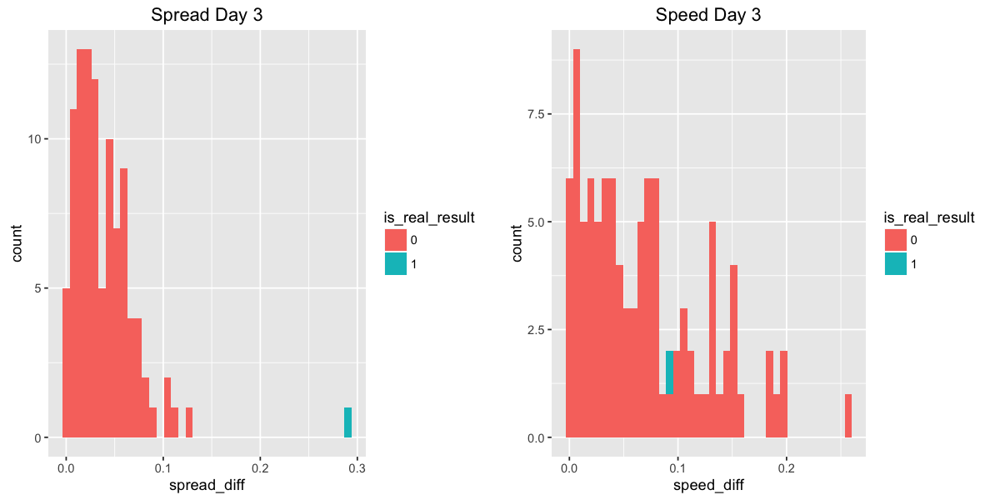

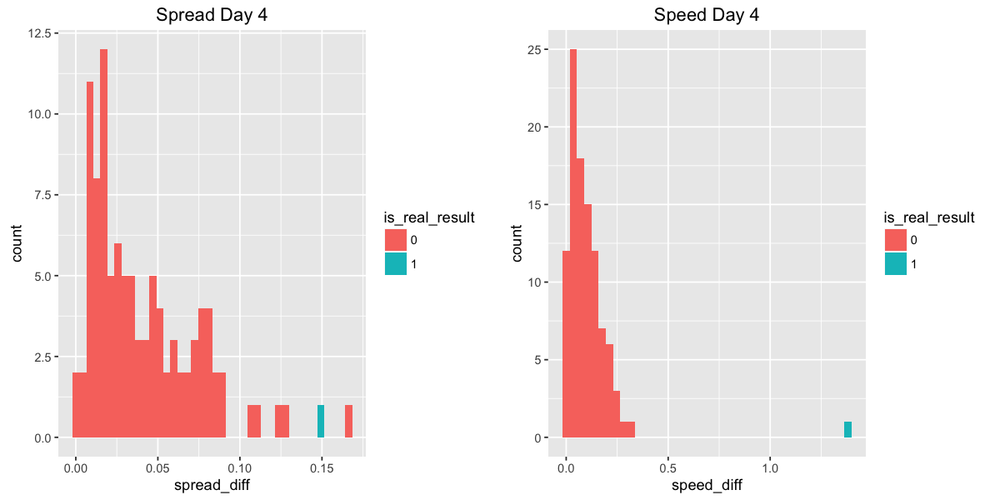

...

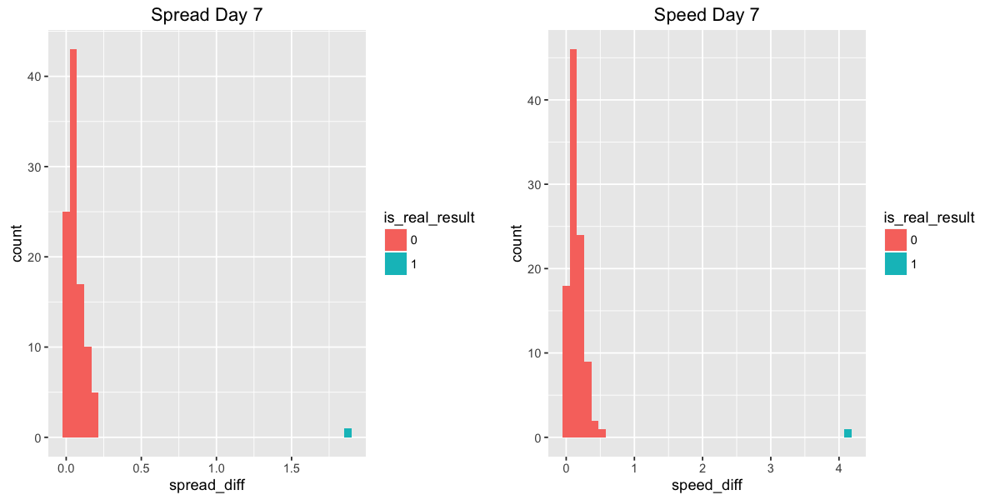

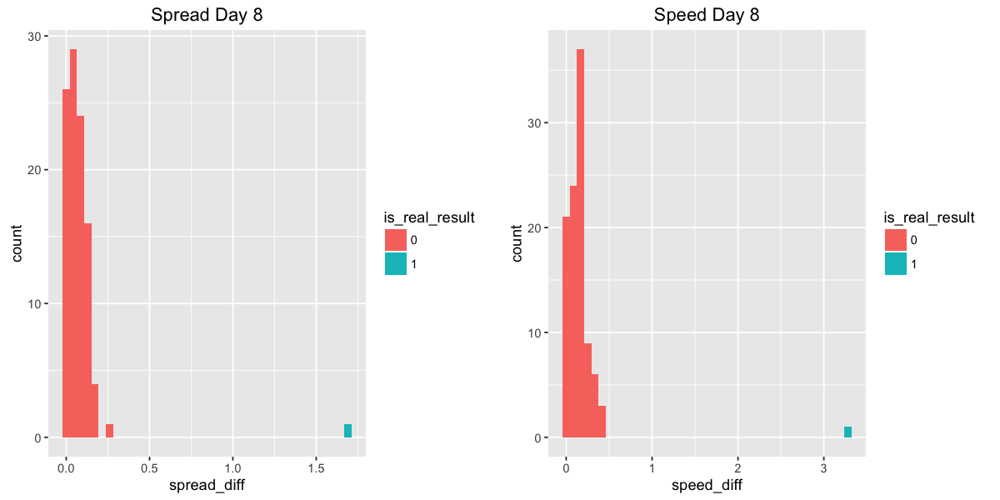

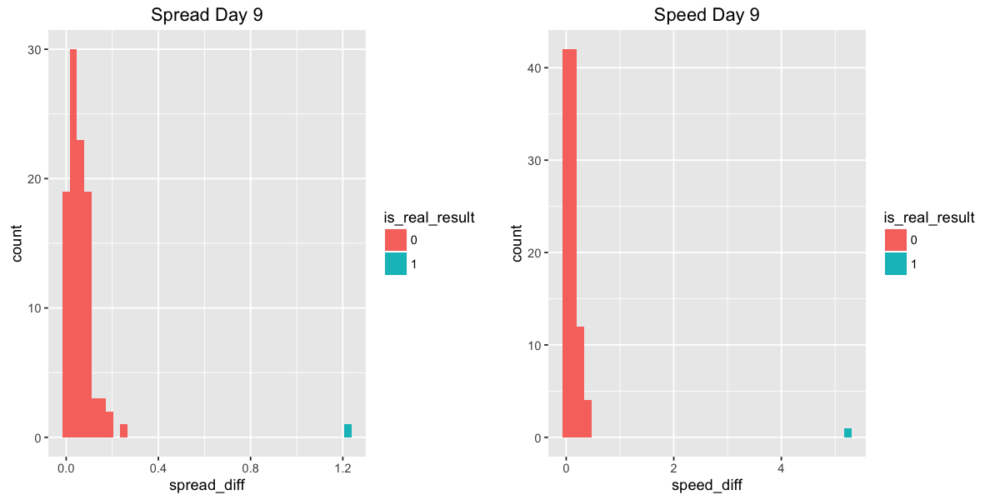

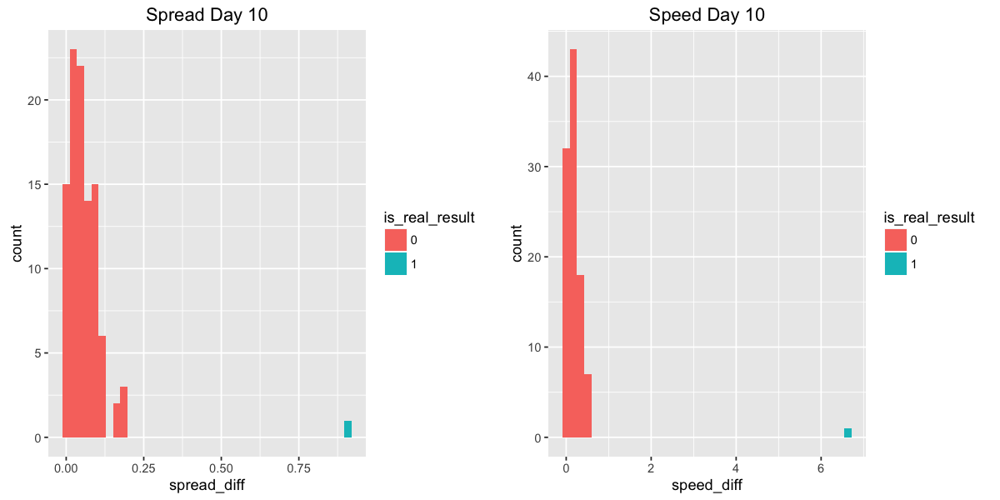

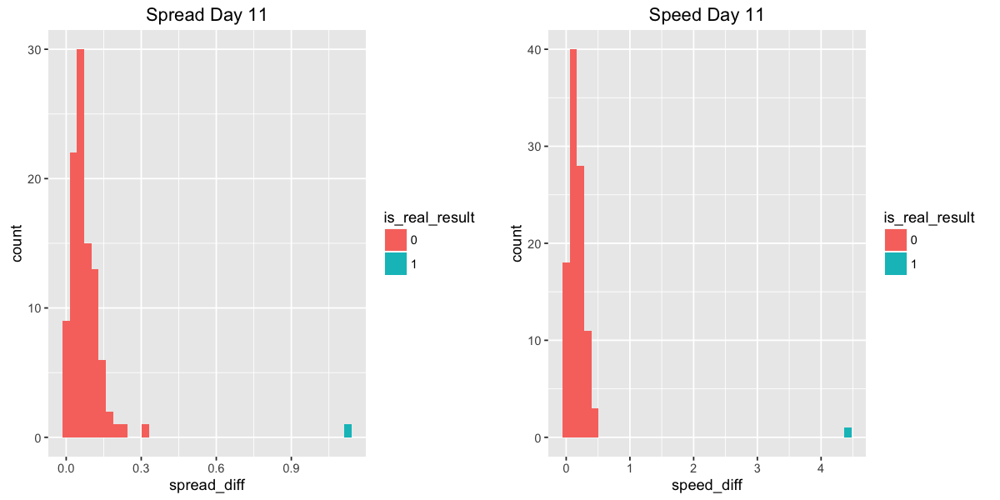

In [60]:
for (i in unique(df_filt_rm_na$day_num))
{
    df_day <- subset(df_filt_rm_na, day_num == i)
    g1 <- ggplot(df_day, aes(x = spread_diff, fill = is_real_result)) + geom_histogram(bins=40) + ggtitle(paste("Spread Day", i))
    g2 <- ggplot(df_day, main='test', aes(x = speed_diff, fill = is_real_result)) + geom_histogram(bins=40) + ggtitle(paste("Speed Day", i))
    multiplot(g1,g2, cols=2)
}

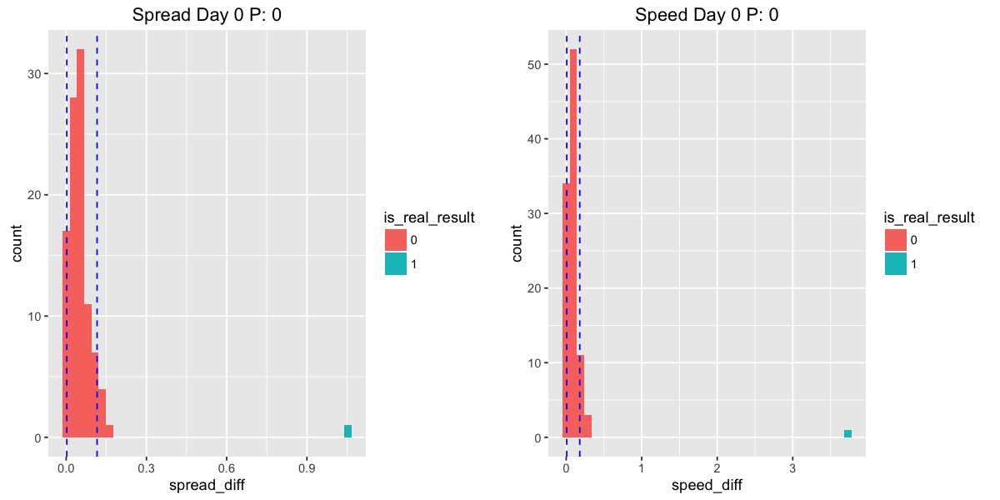

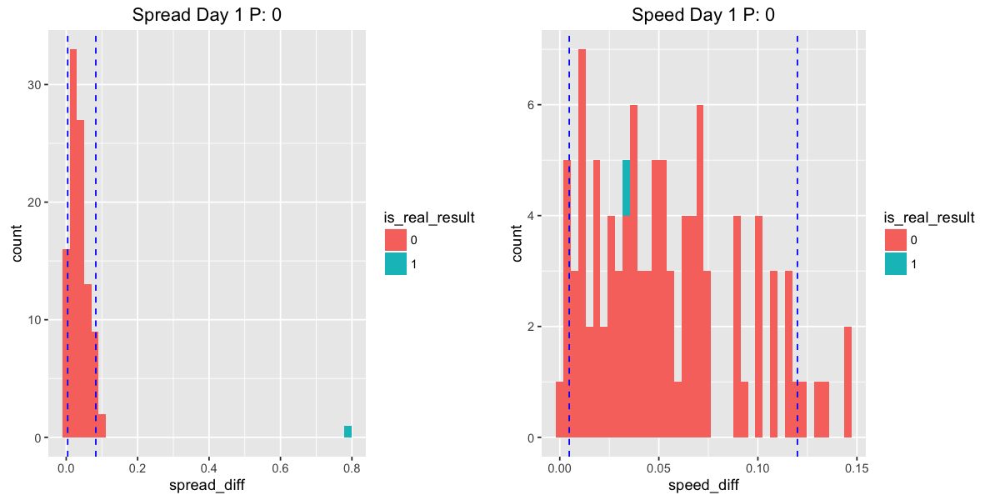

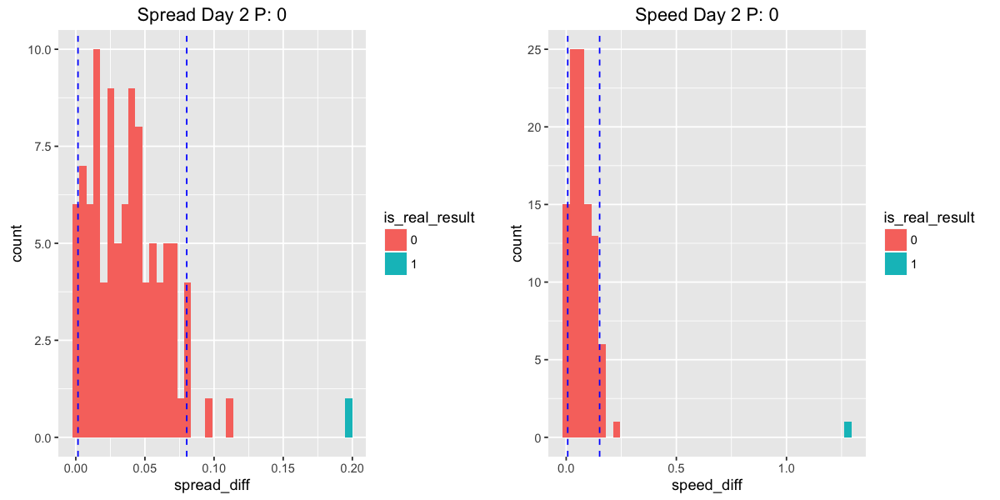

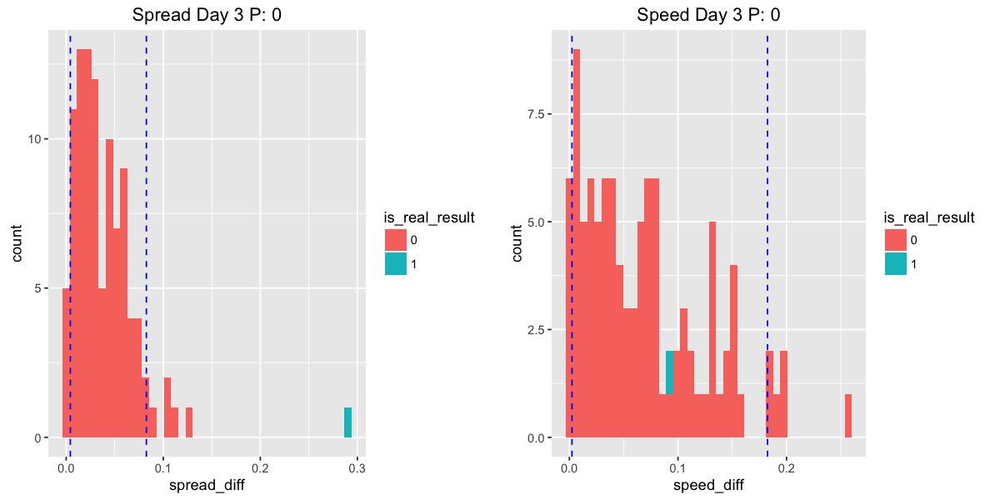

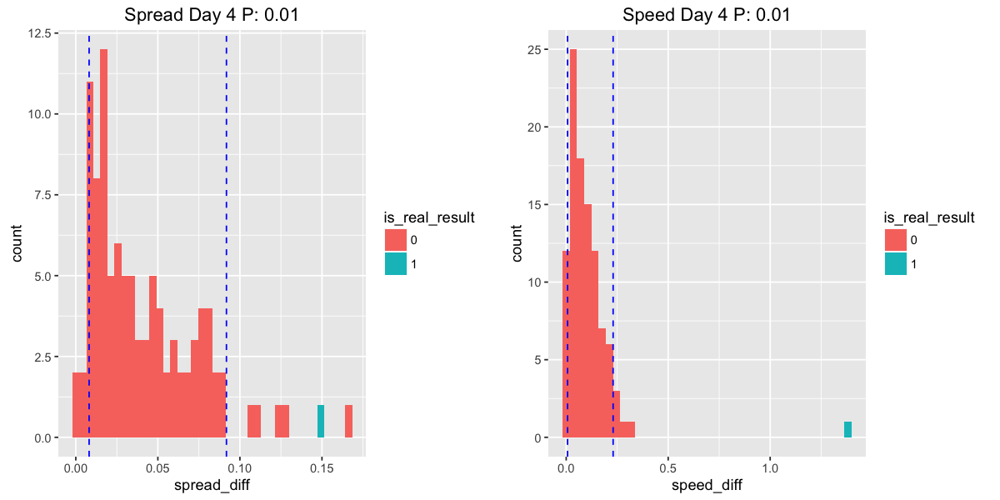

...

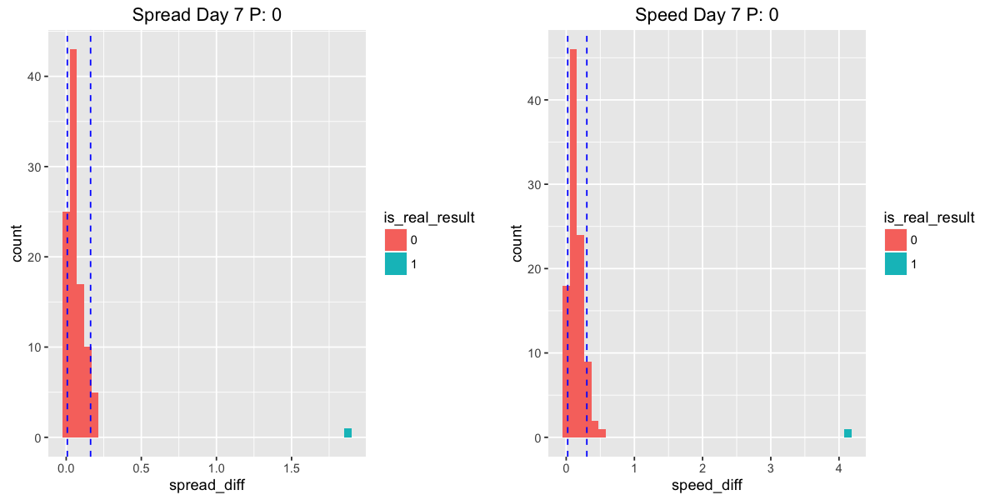

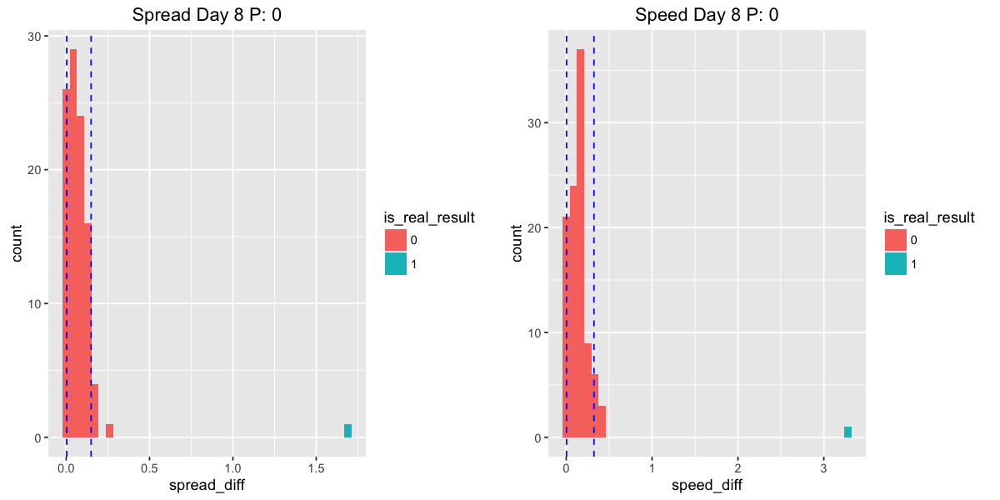

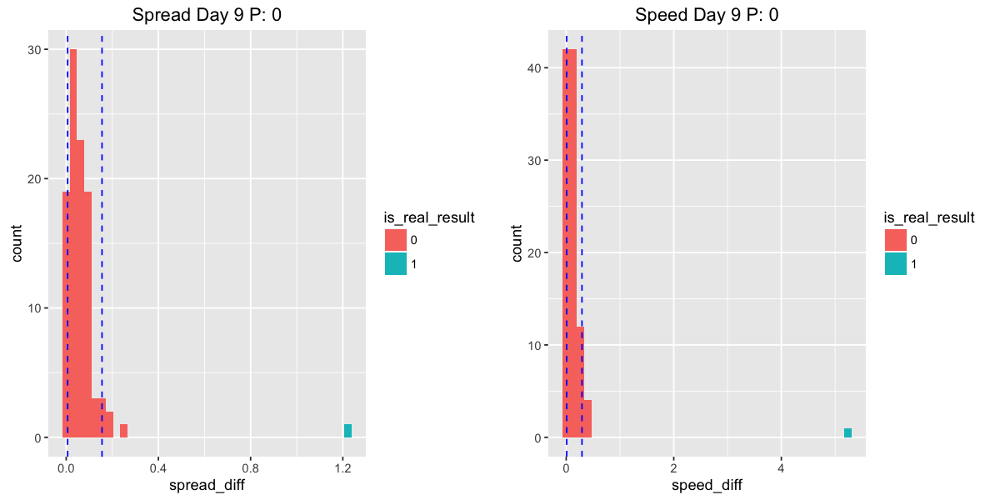

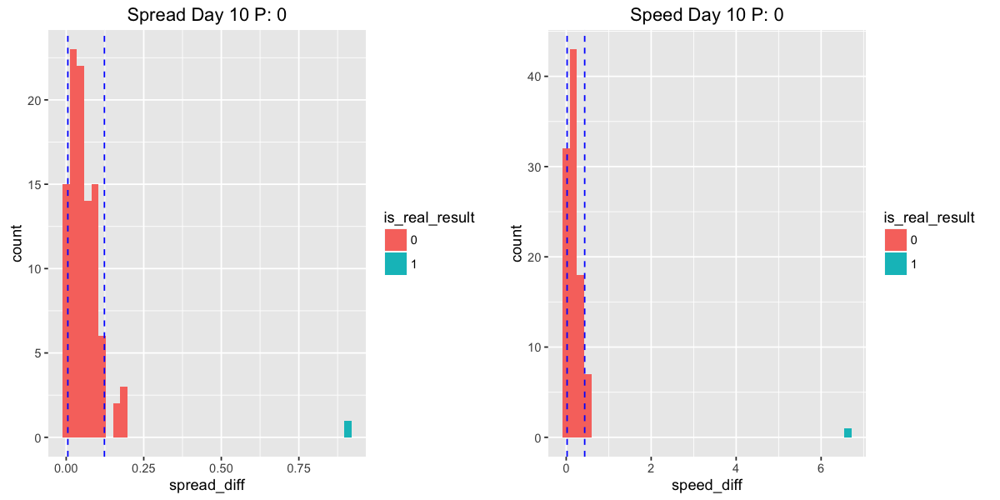

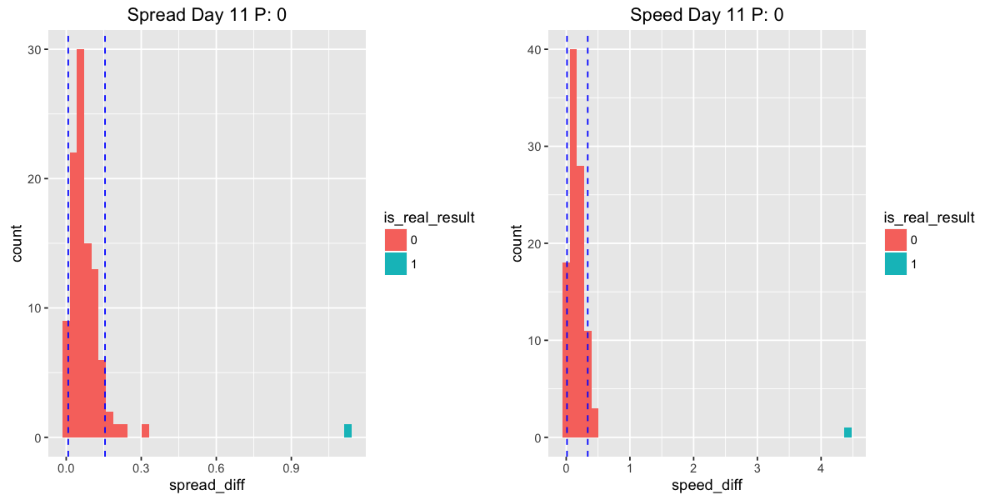

In [82]:
for (i in unique(df_filt_rm_na$day_num))
{   
    real_day <- subset(df_filt_rm_na, day_num == i & is_real_result == 1)
    gen_day <- subset(df_filt_rm_na, day_num == i & is_real_result == 0)
    
    spread_num_greater_h0 <- sum(gen_day$spread_diff > real_day$spread_diff[1])
    spread_p_val <- spread_num_greater_h0 / length(gen_day$spread_diff)
    spread_conf <- quantile(gen_day$spread_diff, c(.05, .95))
    
    speed_num_greater_h0 <- sum(gen_day$speed_diff > real_day$speed_diff[1])
    speed_p_val <- spread_num_greater_h0 / length(gen_day$speed_diff)
    speed_conf <- quantile(gen_day$speed_diff, c(.05, .95))
    
    df_day <- subset(df_filt_rm_na, day_num == i)
    g1 <- ggplot(df_day, aes(x = spread_diff, fill = is_real_result)) + geom_histogram(bins=40) + 
    #coord_cartesian(xlim = c(0, 2)) + #coord_cartesian(ylim = c(0, 10)) +
    ggtitle(paste("Spread Day", i, "P:", spread_p_val)) + geom_vline(xintercept=spread_conf, linetype="dashed", color = "blue")
    g2 <- ggplot(df_day, main='test', aes(x = speed_diff, fill = is_real_result)) + geom_histogram(bins=40) + 
    ggtitle(paste("Speed Day", i, "P:", speed_p_val)) + geom_vline(xintercept=speed_conf, linetype="dashed", color = "blue")
    multiplot(g1,g2, cols=2)
    
}